# StarGAN

### Downloading data
We will use CelebA 64x64 to generate new faces with new attributes

In [ ]:
!pip install git+https://github.com/S-aiueo32/lpips-pytorch.git -q

    Running setup.py install for lpips-pytorch ... done
  DEPRECATION: lpips-pytorch was installed using the legacy 'setup.py install' method, because a wheel could not be built for it. A possible replacement is to fix the wheel build issue reported above. You can find discussion regarding this at https://github.com/pypa/pip/issues/8368.


In [ ]:
import requests
url = 'https://raw.githubusercontent.com/vpozdnyakov/DeepGenerativeModels/spring-2022/utils/datasets/celeba.py'
open('celeba.py', 'wb').write(requests.get(url).content);
url = 'https://raw.githubusercontent.com/vpozdnyakov/DeepGenerativeModels/spring-2022/data/celeba/list_attr_celeba.txt'
open('list_attr_celeba.txt', 'wb').write(requests.get(url).content);


In [ ]:
from celeba import CelebADataset
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import transforms
import matplotlib.pyplot as plt
import numpy as np
import math
from tqdm.auto import trange, tqdm

from torch import Tensor
from time import time
import os
from copy import deepcopy

from lpips_pytorch import LPIPS
from google.colab import drive

Loading readable domain names:

In [ ]:
with open('list_attr_celeba.txt', 'r') as f:
    attr_name = np.array(f.readline().split(' ')[:-1])
attr_name

array(['5_o_Clock_Shadow', 'Arched_Eyebrows', 'Attractive',
       'Bags_Under_Eyes', 'Bald', 'Bangs', 'Big_Lips', 'Big_Nose',
       'Black_Hair', 'Blond_Hair', 'Blurry', 'Brown_Hair',
       'Bushy_Eyebrows', 'Chubby', 'Double_Chin', 'Eyeglasses', 'Goatee',
       'Gray_Hair', 'Heavy_Makeup', 'High_Cheekbones', 'Male',
       'Mouth_Slightly_Open', 'Mustache', 'Narrow_Eyes', 'No_Beard',
       'Oval_Face', 'Pale_Skin', 'Pointy_Nose', 'Receding_Hairline',
       'Rosy_Cheeks', 'Sideburns', 'Smiling', 'Straight_Hair',
       'Wavy_Hair', 'Wearing_Earrings', 'Wearing_Hat', 'Wearing_Lipstick',
       'Wearing_Necklace', 'Wearing_Necktie', 'Young'], dtype='<U19')

### Opening data

In [ ]:
t_normalize = lambda x: x * 2 - 1
t_invnormalize = lambda x: (x + 1) / 2
transform=transforms.Compose([
    transforms.Resize(64),
    transforms.CenterCrop(64),
    transforms.ToTensor(),
    t_normalize,
])

In [ ]:
from random import randint

class CelebaCustomDataset(CelebADataset):
    def __getitem__(self, idx):
        indices = [8, 9, 11, 15, 16, 20, 22, 28, 35, 39]
        image, target = super().__getitem__(idx)
        target = target['attributes'] == 1
        new_target = target[indices]
        if sum(new_target) == 0:
            return self.__getitem__(randint(0, len(self)))
        return image, new_target

In [ ]:
if CROP == False:
    drive.mount('/content/gdrive')
    ! mkdir /content/data/
    ! mkdir /content/data/celeba/
    ! cp '/content/gdrive/My Drive/img_align_celeba.zip' "/content/data/celeba/img_align_celeba.zip"
    import zipfile
    with zipfile.ZipFile("/content/data/celeba/img_align_celeba.zip", 'r') as zip_ref:
        zip_ref.extractall("/content/data/celeba/")

Mounted at /content/gdrive


In [ ]:
attr_name = attr_name[[8, 9, 11, 15, 16, 20, 22, 28, 35, 39]]

In [ ]:
dataset = CelebaCustomDataset(
    transform=transform,
    attr_file_path='list_attr_celeba.txt',
    crop=CROP
)
img, attr = dataset[0]
img.shape

torch.Size([3, 64, 64])

### Visualizing data

In [ ]:
def plot_img(img, transform):
    plt.imshow(transform(img).permute(1, 2, 0))
    plt.axis('off')

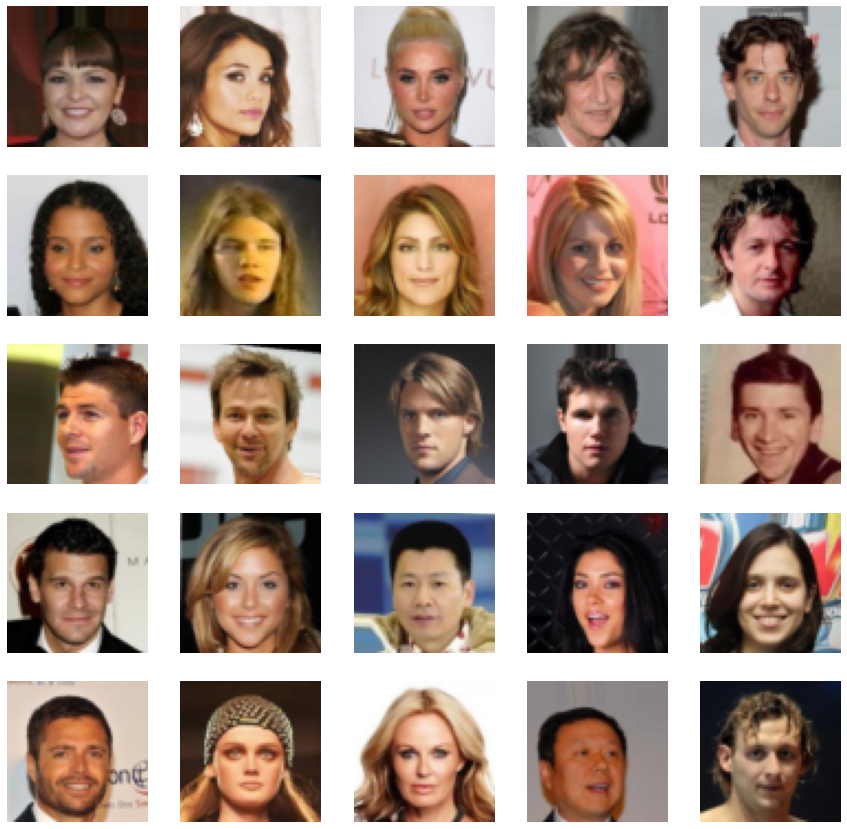

In [ ]:
plt.figure(figsize=(15, 15))

for i in range(25):
    img, attr = dataset[np.random.randint(len(dataset))]
    plt.subplot(5, 5, i + 1)
    plot_img(img, t_invnormalize)
plt.show()

### Low-res StarGanV1 model





<img src='https://raw.githubusercontent.com/vpozdnyakov/DeepGenerativeModels/spring-2022/images/stargan_v1.png' width=600>



In [ ]:
class Generator(nn.Module):
    def __init__(self, in_c=10, hidden_dim=32):
 
        super().__init__()
        self.way_down = nn.ModuleList([
            self.build_downblock(in_c + 3, hidden_dim, 7, 1, 3),
            self.build_downblock(hidden_dim, hidden_dim * 2, 4, 2, 1),
            self.build_downblock(hidden_dim * 2, hidden_dim * 4, 4, 2, 1)
        ])

        midsz = hidden_dim * 4
        self.bottleneck = nn.Sequential(
            self.build_downblock(midsz, midsz, 3, 1, 1),
            self.build_downblock(midsz, midsz, 3, 1, 1),
            self.build_downblock(midsz, midsz, 3, 1, 1),
            self.build_downblock(midsz, midsz, 3, 1, 1),
            self.build_downblock(midsz, midsz, 3, 1, 1),
            self.build_downblock(midsz, midsz, 3, 1, 1)
        )

        self.way_up = nn.ModuleList([
            nn.Sequential(
                nn.ConvTranspose2d(midsz * 2, hidden_dim * 2, kernel_size=4, 
                               stride=2, padding=1, bias=False),
                nn.BatchNorm2d(hidden_dim * 2, affine=True, 
                              track_running_stats=True),
                nn.ReLU(inplace=True)),
            nn.Sequential(
                nn.ConvTranspose2d(hidden_dim * 4, hidden_dim, kernel_size=4,
                               stride=2, padding=1, bias=False),
                nn.BatchNorm2d(hidden_dim, affine=True, 
                              track_running_stats=True),
                nn.ReLU(inplace=True)),
            nn.Sequential(
                nn.Conv2d(hidden_dim * 2, 3, kernel_size=7, 
                        stride=1, padding=3, bias=False),
                nn.Tanh()
            )
        ])

    def forward(self, x: Tensor, y: Tensor):
        """
        x: original image 
        y: target domain
        """
        h, w = x.size(2), x.size(3)
        y = y.view(y.size(0), y.size(1), 1, 1).repeat(1, 1, h, w)
        x = torch.cat([x, y], dim=1)

        skip_cons = []
        for lay in self.way_down:
            x = lay(x)
            skip_cons.append(deepcopy(x.detach()))

        x = self.bottleneck(x)
        
        for lay in self.way_up:
            x = torch.cat((x, skip_cons.pop()), dim=1)
            x = lay(x)

        return x

    def build_downblock(self, c_in, c_out, K, S, P):
        return nn.Sequential(
            nn.Conv2d(c_in, c_out, kernel_size=K, 
                      stride=S, padding=P, bias=False),
            nn.BatchNorm2d(c_out, affine=True, track_running_stats=True),
            nn.ReLU(inplace=True)
        )

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, in_c=10, hidden_dim=32):
        super().__init__()
        self.input_layer = self.build_layer(3, hidden_dim, 4, 2, 1)
        self.hidden_layers = nn.Sequential(
            self.build_layer(hidden_dim, hidden_dim * 2, 4, 2, 1),
            self.build_layer(hidden_dim * 2, hidden_dim * 4, 4, 2, 1),
            self.build_layer(hidden_dim * 4, hidden_dim * 8, 4, 2, 1),
            self.build_layer(hidden_dim * 8, hidden_dim * 16, 4, 2, 1),
            self.build_layer(hidden_dim * 16, hidden_dim * 32, 4, 2, 1),
            nn.Flatten()
        )

        self.output_src = nn.Linear(hidden_dim * 32, 1)
        self.output_cls = nn.Linear(hidden_dim * 32, in_c)

    def forward(self, x: Tensor):
        x = self.input_layer(x)
        x = self.hidden_layers(x)
        outp_src = self.output_src(x)
        outp_cls = self.output_cls(x)
        return outp_src, outp_cls

    def build_layer(self, c_in, c_out, K, S, P):
        return nn.Sequential(
            nn.Conv2d(c_in, c_out, kernel_size=K, 
                      stride=S, padding=P, bias=False),
            nn.LeakyReLU(0.01)
        )

Дальше идут несколько вспомогательных клеточек которые вы можете использовать, а можете не использовать

In [ ]:
dataloader = torch.utils.data.DataLoader(dataset, batch_size=32, drop_last=True)
BATCH_PRINT = len(dataloader) // 10

device = 'cuda:0' if torch.cuda.is_available() else 'cpu'

In [ ]:
def evaluate_model(dataloader, generator):
    values = []
    for x_real, label in tqdm(dataloader):
        x_real, label = x_real.to(device), label.to(device).float()
        target_domain = label.flip(dims=[0])

        with torch.no_grad():
            x_fake = generator(x_real, target_domain)

        values.append(lpips(x_fake, x_real).squeeze().item())
    return np.mean(values)

In [ ]:
lpips = LPIPS().to(device)

Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth


  0%|          | 0.00/233M [00:00<?, ?B/s]

Downloading: "https://raw.githubusercontent.com/richzhang/PerceptualSimilarity/master/lpips/weights/v0.1/alex.pth" to /root/.cache/torch/hub/checkpoints/alex.pth


  0%|          | 0.00/5.87k [00:00<?, ?B/s]

In [ ]:
adversarial_criterion = nn.BCEWithLogitsLoss(reduction='sum')
criterion = nn.L1Loss()
COEF_STYLE = 1
COEF_GRAD = 10
COEF_RECONSTR = 10

def string_time(elapsed):
    return "%im %is" %(int(elapsed / 60), int(elapsed % 60))

def strip_string(string):
    return [s for s in string if s[0] != '<']

def train_epoch_gan(gen, disc, gen_opt, disc_opt, gen_step_freq=5):
    # ======== training ========
    print('Training...\n')

    gen.train()
    run_gen = []
    run_disc = []
    global step_num

    for step, batch in enumerate(dataloader):
        true_img, true_style = batch[0].to(device), batch[1].float().to(device)

        M = true_style.shape[0]
        tgt_style = true_style[torch.randperm(M)]

        if step % BATCH_PRINT == 0 and not step == 0:
            print('  Batch %i  of  %i;\tElapsed time: ' %(step + 1, len(dataloader)) + string_time(time() - start))

        # ======== discriminator ========
        ###############
        opinion_img, opinion_style = disc(true_img)
        disc_loss_style = adversarial_criterion(opinion_style, true_style) / M
        disc_loss_true = -torch.sum(opinion_img) / M

        fake_img = gen(true_img, tgt_style)
        opinion_img, opinion_style = disc(deepcopy(fake_img.detach()))
        disc_loss_fake = torch.mean(opinion_img)

        ###############
        coefs = torch.rand(M, 1, 1, 1).to(device)

        mix_img = (coefs * true_img.detach() +
                   (1 - coefs) * fake_img.detach())
        mix_img.requires_grad_(True)

        opinion_img, opinion_style = disc(mix_img)

        weight = torch.ones_like(opinion_img)
        grads = torch.autograd.grad(outputs=opinion_img,
                                   inputs=mix_img,
                                   grad_outputs=weight,
                                   create_graph=True)

        lenG = grads[0].shape[0]
        grads = grads[0].view(lenG, -1)
        grads = torch.sum(grads ** 2, dim=1)
        grads = torch.sqrt(grads)
        disc_loss_grad = torch.mean((grads - 1) ** 2)

        # > loss
        disc_loss = (COEF_STYLE * disc_loss_style + 
                     COEF_GRAD * disc_loss_grad + 
                     disc_loss_true + 
                     disc_loss_fake)
        disc_opt.zero_grad()
        disc_loss.backward()
        disc_opt.step()

        step_num += 1
        if step_num % gen_step_freq != 0:
            continue

        # ======== generator ========
        fake_img = gen(true_img, tgt_style)

        re_img = gen(fake_img, true_style)
        gen_loss_re = criterion(true_img, re_img)

        opinion_img, opinion_style = disc(fake_img)
        gen_loss_style = adversarial_criterion(opinion_style, tgt_style) / M
        gen_loss_fake = -torch.sum(opinion_img) / M

        # > loss
        gen_loss = (gen_loss_fake + 
                  COEF_RECONSTR * gen_loss_re + 
                  COEF_STYLE * gen_loss_style)
        gen_opt.zero_grad()
        gen_loss.backward()
        gen_opt.step()

        run_gen.append(gen_loss.item())
        run_disc.append(disc_loss.item())

    return run_gen, run_disc


def train_model_gan(model, disc, gen_opt, disc_opt, gen_schd, disc_schd,
                    num_epochs=25, name='model', continuing=False, epoch_save=2):

    dir = "./models/" + name + "/"
    if not os.path.exists("./models/"):
        os.mkdir("./models/")
    if not os.path.exists(dir):
        os.mkdir(dir)

    global start, train_history, val_history, fid_history, disc_history, fid, step_num

    if not continuing:
        train_history = []
        disc_history = []
        val_history = []
        fid_history = []
        step_num = 0
        fid = 1000

    start = time()

    for epoch in range(num_epochs):

        print('\n======= Epoch %i / %i =======' %(epoch + 1, num_epochs))

        run_loss, run_disc = train_epoch_gan(model, disc, gen_opt, disc_opt)
        if run_loss != None:
            train_history.append(np.array(run_loss))
            disc_history.append(np.array(run_disc))

        gen_schd.step()
        disc_schd.step()
            
        print("\n  Training statistics:   \tG_loss: %.3f \tD_loss: %.3f"  %(train_history[-1].mean(), disc_history[-1].mean()))
        
        # ======== logging ========

        print("\nValidating & Saving...")
        if (epoch + 1) % epoch_save == 0:
            torch.save(model.state_dict(), 
                       dir + "checkpoint" + str(epoch + 1) + "_" + 'gen')
            torch.save(disc.state_dict(), 
                       dir + "checkpoint" + str(epoch + 1) + "_" + 'disc')
            lpips = evaluate_model(dataloader, gen) / 32

            print("\n  Validation statistics:\tLPIPS: %.3f"  %(lpips))
        show_imgs(1)

        #np.save(dir + 'train_logs' + "_" + name, np.array(train_history))
        #np.save(dir + 'disc_logs' + "_" + name, np.array(disc_history))
        
        print("  Elapsed time: " + string_time(time() - start))
    
    return model

### Training loop


======= Epoch 1 / 15 =======
Training...

  Batch 634  of  6331;	Elapsed time: 1m 7s
  Batch 1267  of  6331;	Elapsed time: 2m 14s
  Batch 1900  of  6331;	Elapsed time: 3m 21s
  Batch 2533  of  6331;	Elapsed time: 4m 28s
  Batch 3166  of  6331;	Elapsed time: 5m 34s
  Batch 3799  of  6331;	Elapsed time: 6m 41s
  Batch 4432  of  6331;	Elapsed time: 7m 47s
  Batch 5065  of  6331;	Elapsed time: 8m 54s
  Batch 5698  of  6331;	Elapsed time: 10m 0s
  Batch 6331  of  6331;	Elapsed time: 11m 7s

  Training statistics:   	G_loss: 9.032 	D_loss: -3.129

Validating & Saving...


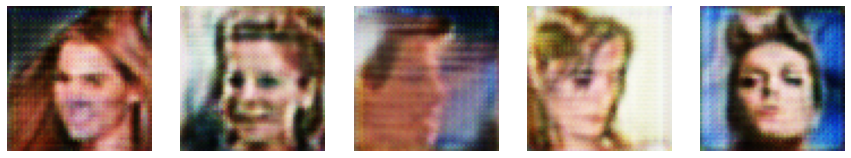

  Elapsed time: 11m 8s

======= Epoch 2 / 15 =======
Training...

  Batch 634  of  6331;	Elapsed time: 12m 14s
  Batch 1267  of  6331;	Elapsed time: 13m 20s
  Batch 1900  of  6331;	Elapsed time: 14m 26s
  Batch 2533  of  6331;	Elapsed time: 15m 32s
  Batch 3166  of  6331;	Elapsed time: 16m 38s
  Batch 3799  of  6331;	Elapsed time: 17m 44s
  Batch 4432  of  6331;	Elapsed time: 18m 51s
  Batch 5065  of  6331;	Elapsed time: 19m 57s
  Batch 5698  of  6331;	Elapsed time: 21m 3s
  Batch 6331  of  6331;	Elapsed time: 22m 9s

  Training statistics:   	G_loss: 8.067 	D_loss: -2.430

Validating & Saving...


  0%|          | 0/6331 [00:00<?, ?it/s]


  Validation statistics:	LPIPS: 0.143


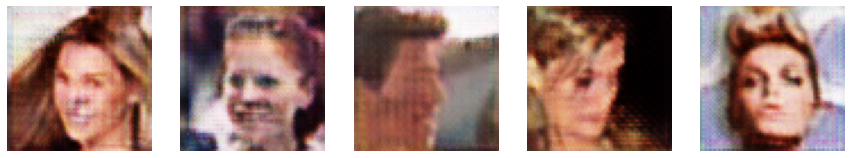

  Elapsed time: 29m 51s

======= Epoch 3 / 15 =======
Training...

  Batch 634  of  6331;	Elapsed time: 30m 57s
  Batch 1267  of  6331;	Elapsed time: 32m 3s
  Batch 1900  of  6331;	Elapsed time: 33m 9s
  Batch 2533  of  6331;	Elapsed time: 34m 15s
  Batch 3166  of  6331;	Elapsed time: 35m 21s
  Batch 3799  of  6331;	Elapsed time: 36m 28s
  Batch 4432  of  6331;	Elapsed time: 37m 34s
  Batch 5065  of  6331;	Elapsed time: 38m 40s
  Batch 5698  of  6331;	Elapsed time: 39m 46s
  Batch 6331  of  6331;	Elapsed time: 40m 53s

  Training statistics:   	G_loss: 4.770 	D_loss: -0.519

Validating & Saving...


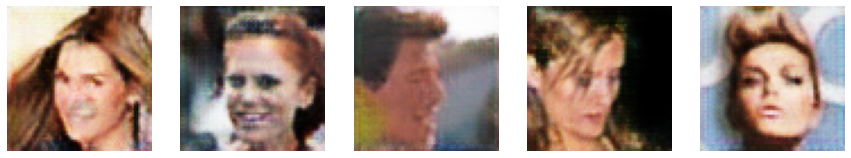

  Elapsed time: 40m 53s

======= Epoch 4 / 15 =======
Training...

  Batch 634  of  6331;	Elapsed time: 42m 0s
  Batch 1267  of  6331;	Elapsed time: 43m 6s
  Batch 1900  of  6331;	Elapsed time: 44m 12s
  Batch 2533  of  6331;	Elapsed time: 45m 18s
  Batch 3166  of  6331;	Elapsed time: 46m 23s
  Batch 3799  of  6331;	Elapsed time: 47m 29s
  Batch 4432  of  6331;	Elapsed time: 48m 35s
  Batch 5065  of  6331;	Elapsed time: 49m 41s
  Batch 5698  of  6331;	Elapsed time: 50m 48s
  Batch 6331  of  6331;	Elapsed time: 51m 54s

  Training statistics:   	G_loss: 4.415 	D_loss: -0.392

Validating & Saving...


  0%|          | 0/6331 [00:00<?, ?it/s]


  Validation statistics:	LPIPS: 0.084


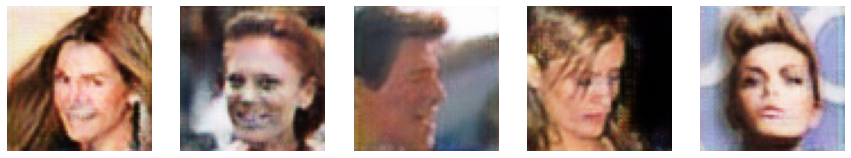

  Elapsed time: 59m 52s

======= Epoch 5 / 15 =======
Training...

  Batch 634  of  6331;	Elapsed time: 60m 58s
  Batch 1267  of  6331;	Elapsed time: 62m 4s
  Batch 1900  of  6331;	Elapsed time: 63m 10s
  Batch 2533  of  6331;	Elapsed time: 64m 16s
  Batch 3166  of  6331;	Elapsed time: 65m 21s
  Batch 3799  of  6331;	Elapsed time: 66m 27s
  Batch 4432  of  6331;	Elapsed time: 67m 33s
  Batch 5065  of  6331;	Elapsed time: 68m 38s
  Batch 5698  of  6331;	Elapsed time: 69m 44s
  Batch 6331  of  6331;	Elapsed time: 70m 51s

  Training statistics:   	G_loss: 4.126 	D_loss: -0.315

Validating & Saving...


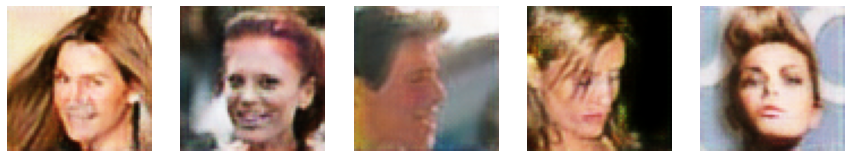

  Elapsed time: 70m 51s

======= Epoch 6 / 15 =======
Training...

  Batch 634  of  6331;	Elapsed time: 71m 58s
  Batch 1267  of  6331;	Elapsed time: 73m 4s
  Batch 1900  of  6331;	Elapsed time: 74m 10s
  Batch 2533  of  6331;	Elapsed time: 75m 17s
  Batch 3166  of  6331;	Elapsed time: 76m 23s
  Batch 3799  of  6331;	Elapsed time: 77m 29s
  Batch 4432  of  6331;	Elapsed time: 78m 36s
  Batch 5065  of  6331;	Elapsed time: 79m 42s
  Batch 5698  of  6331;	Elapsed time: 80m 48s
  Batch 6331  of  6331;	Elapsed time: 81m 54s

  Training statistics:   	G_loss: 4.432 	D_loss: -0.365

Validating & Saving...


  0%|          | 0/6331 [00:00<?, ?it/s]


  Validation statistics:	LPIPS: 0.091


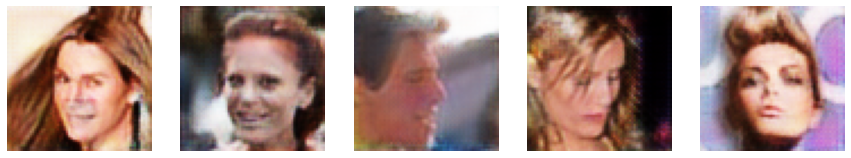

  Elapsed time: 90m 7s

======= Epoch 7 / 15 =======
Training...

  Batch 634  of  6331;	Elapsed time: 91m 13s
  Batch 1267  of  6331;	Elapsed time: 92m 19s
  Batch 1900  of  6331;	Elapsed time: 93m 25s
  Batch 2533  of  6331;	Elapsed time: 94m 31s
  Batch 3166  of  6331;	Elapsed time: 95m 37s
  Batch 3799  of  6331;	Elapsed time: 96m 42s
  Batch 4432  of  6331;	Elapsed time: 97m 48s
  Batch 5065  of  6331;	Elapsed time: 98m 54s
  Batch 5698  of  6331;	Elapsed time: 100m 0s
  Batch 6331  of  6331;	Elapsed time: 101m 6s

  Training statistics:   	G_loss: 3.906 	D_loss: -0.247

Validating & Saving...


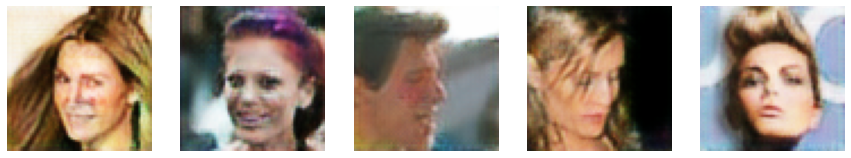

  Elapsed time: 101m 6s

======= Epoch 8 / 15 =======
Training...

  Batch 634  of  6331;	Elapsed time: 102m 12s
  Batch 1267  of  6331;	Elapsed time: 103m 18s
  Batch 1900  of  6331;	Elapsed time: 104m 24s
  Batch 2533  of  6331;	Elapsed time: 105m 30s
  Batch 3166  of  6331;	Elapsed time: 106m 36s
  Batch 3799  of  6331;	Elapsed time: 107m 42s
  Batch 4432  of  6331;	Elapsed time: 108m 47s
  Batch 5065  of  6331;	Elapsed time: 109m 53s
  Batch 5698  of  6331;	Elapsed time: 110m 59s
  Batch 6331  of  6331;	Elapsed time: 112m 6s

  Training statistics:   	G_loss: 4.043 	D_loss: -0.259

Validating & Saving...


  0%|          | 0/6331 [00:00<?, ?it/s]


  Validation statistics:	LPIPS: 0.073


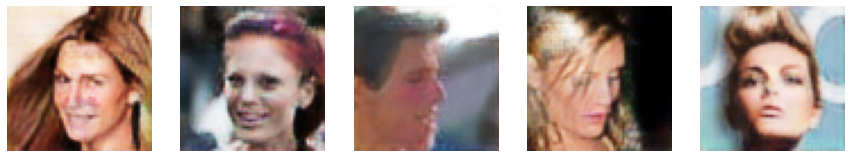

  Elapsed time: 120m 37s

======= Epoch 9 / 15 =======
Training...



KeyboardInterrupt: ignored

In [ ]:
torch.manual_seed(115)
gen = Generator().to(device)
disc = Discriminator().to(device)

gen_opt = torch.optim.Adam(gen.parameters(), 0.0001, [0.5, 0.999]) 
disc_opt = torch.optim.Adam(disc.parameters(), 0.0001, [0.5, 0.999])
gen_schd = torch.optim.lr_scheduler.MultiStepLR(gen_opt, milestones=[10,15], 
                                                gamma=0.1)
disc_schd = torch.optim.lr_scheduler.MultiStepLR(disc_opt, milestones=[10,15], 
                                                 gamma=0.1)
step_num = 0

train_model_gan(gen, disc, gen_opt, disc_opt, gen_schd, disc_schd, num_epochs=15)


======= Epoch 1 / 15 =======
Training...

  Batch 634  of  6331;	Elapsed time: 1m 7s
  Batch 1267  of  6331;	Elapsed time: 2m 14s
  Batch 1900  of  6331;	Elapsed time: 3m 20s
  Batch 2533  of  6331;	Elapsed time: 4m 26s
  Batch 3166  of  6331;	Elapsed time: 5m 33s
  Batch 3799  of  6331;	Elapsed time: 6m 39s
  Batch 4432  of  6331;	Elapsed time: 7m 45s
  Batch 5065  of  6331;	Elapsed time: 8m 51s
  Batch 5698  of  6331;	Elapsed time: 9m 58s
  Batch 6331  of  6331;	Elapsed time: 11m 5s

  Training statistics:   	G_loss: 4.013 	D_loss: -0.233

Validating & Saving...


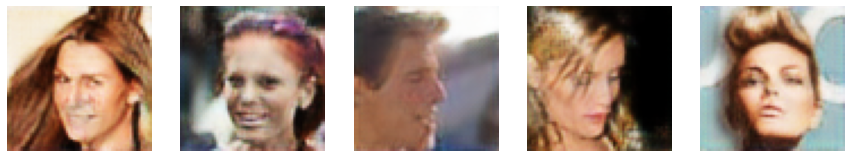

  Elapsed time: 11m 5s

======= Epoch 2 / 15 =======
Training...

  Batch 634  of  6331;	Elapsed time: 12m 12s
  Batch 1267  of  6331;	Elapsed time: 13m 18s
  Batch 1900  of  6331;	Elapsed time: 14m 25s
  Batch 2533  of  6331;	Elapsed time: 15m 31s
  Batch 3166  of  6331;	Elapsed time: 16m 38s
  Batch 3799  of  6331;	Elapsed time: 17m 45s
  Batch 4432  of  6331;	Elapsed time: 18m 51s
  Batch 5065  of  6331;	Elapsed time: 19m 58s
  Batch 5698  of  6331;	Elapsed time: 21m 4s
  Batch 6331  of  6331;	Elapsed time: 22m 11s

  Training statistics:   	G_loss: 3.612 	D_loss: -0.138

Validating & Saving...


  0%|          | 0/6331 [00:00<?, ?it/s]


  Validation statistics:	LPIPS: 0.071


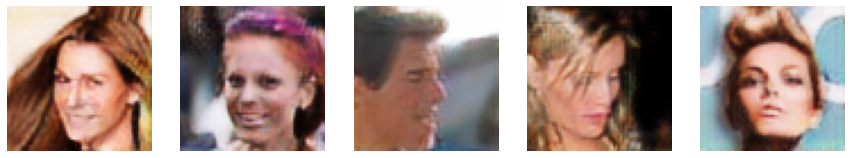

  Elapsed time: 29m 54s

======= Epoch 3 / 15 =======
Training...

  Batch 634  of  6331;	Elapsed time: 31m 0s
  Batch 1267  of  6331;	Elapsed time: 32m 6s
  Batch 1900  of  6331;	Elapsed time: 33m 12s
  Batch 2533  of  6331;	Elapsed time: 34m 18s
  Batch 3166  of  6331;	Elapsed time: 35m 25s
  Batch 3799  of  6331;	Elapsed time: 36m 31s
  Batch 4432  of  6331;	Elapsed time: 37m 36s
  Batch 5065  of  6331;	Elapsed time: 38m 42s
  Batch 5698  of  6331;	Elapsed time: 39m 48s
  Batch 6331  of  6331;	Elapsed time: 40m 55s

  Training statistics:   	G_loss: 4.207 	D_loss: -0.325

Validating & Saving...


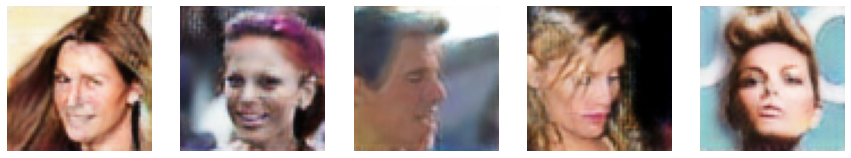

  Elapsed time: 40m 55s

======= Epoch 4 / 15 =======
Training...

  Batch 634  of  6331;	Elapsed time: 42m 1s
  Batch 1267  of  6331;	Elapsed time: 43m 7s
  Batch 1900  of  6331;	Elapsed time: 44m 13s
  Batch 2533  of  6331;	Elapsed time: 45m 19s
  Batch 3166  of  6331;	Elapsed time: 46m 25s
  Batch 3799  of  6331;	Elapsed time: 47m 31s
  Batch 4432  of  6331;	Elapsed time: 48m 37s
  Batch 5065  of  6331;	Elapsed time: 49m 44s
  Batch 5698  of  6331;	Elapsed time: 50m 50s
  Batch 6331  of  6331;	Elapsed time: 51m 56s

  Training statistics:   	G_loss: 3.953 	D_loss: -0.278

Validating & Saving...


  0%|          | 0/6331 [00:00<?, ?it/s]


  Validation statistics:	LPIPS: 0.078


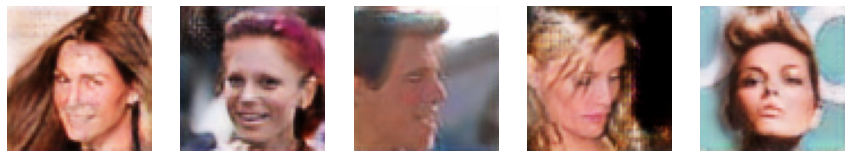

  Elapsed time: 59m 52s

======= Epoch 5 / 15 =======
Training...

  Batch 634  of  6331;	Elapsed time: 60m 58s
  Batch 1267  of  6331;	Elapsed time: 62m 5s
  Batch 1900  of  6331;	Elapsed time: 63m 11s
  Batch 2533  of  6331;	Elapsed time: 64m 17s
  Batch 3166  of  6331;	Elapsed time: 65m 23s
  Batch 3799  of  6331;	Elapsed time: 66m 29s
  Batch 4432  of  6331;	Elapsed time: 67m 36s
  Batch 5065  of  6331;	Elapsed time: 68m 41s
  Batch 5698  of  6331;	Elapsed time: 69m 48s
  Batch 6331  of  6331;	Elapsed time: 70m 54s

  Training statistics:   	G_loss: 3.648 	D_loss: -0.222

Validating & Saving...


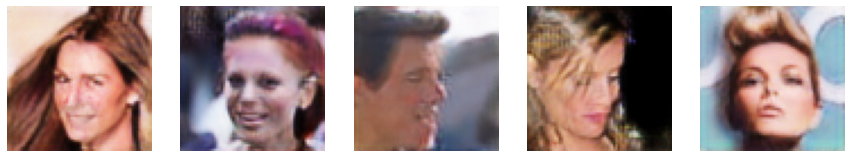

  Elapsed time: 70m 54s

======= Epoch 6 / 15 =======
Training...

  Batch 634  of  6331;	Elapsed time: 72m 0s
  Batch 1267  of  6331;	Elapsed time: 73m 6s
  Batch 1900  of  6331;	Elapsed time: 74m 12s
  Batch 2533  of  6331;	Elapsed time: 75m 18s
  Batch 3166  of  6331;	Elapsed time: 76m 24s
  Batch 3799  of  6331;	Elapsed time: 77m 30s
  Batch 4432  of  6331;	Elapsed time: 78m 36s
  Batch 5065  of  6331;	Elapsed time: 79m 42s
  Batch 5698  of  6331;	Elapsed time: 80m 48s
  Batch 6331  of  6331;	Elapsed time: 81m 54s

  Training statistics:   	G_loss: 4.199 	D_loss: -0.366

Validating & Saving...


  0%|          | 0/6331 [00:00<?, ?it/s]


  Validation statistics:	LPIPS: 0.084


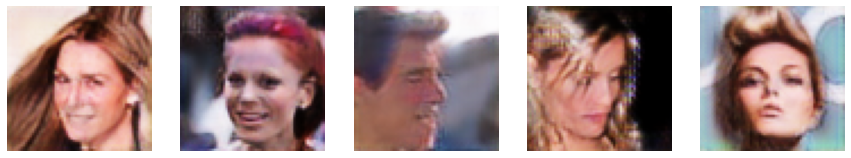

  Elapsed time: 90m 4s

======= Epoch 7 / 15 =======
Training...

  Batch 634  of  6331;	Elapsed time: 91m 10s
  Batch 1267  of  6331;	Elapsed time: 92m 16s
  Batch 1900  of  6331;	Elapsed time: 93m 22s
  Batch 2533  of  6331;	Elapsed time: 94m 28s
  Batch 3166  of  6331;	Elapsed time: 95m 34s
  Batch 3799  of  6331;	Elapsed time: 96m 40s
  Batch 4432  of  6331;	Elapsed time: 97m 46s
  Batch 5065  of  6331;	Elapsed time: 98m 52s
  Batch 5698  of  6331;	Elapsed time: 99m 58s
  Batch 6331  of  6331;	Elapsed time: 101m 4s

  Training statistics:   	G_loss: 4.197 	D_loss: -0.307

Validating & Saving...


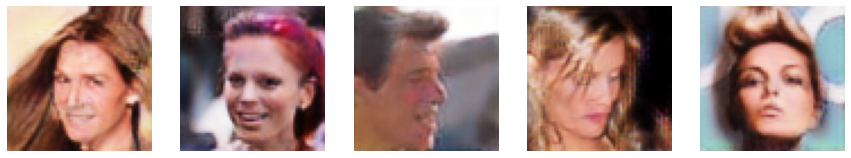

  Elapsed time: 101m 4s

======= Epoch 8 / 15 =======
Training...

  Batch 634  of  6331;	Elapsed time: 102m 10s
  Batch 1267  of  6331;	Elapsed time: 103m 17s
  Batch 1900  of  6331;	Elapsed time: 104m 23s
  Batch 2533  of  6331;	Elapsed time: 105m 29s
  Batch 3166  of  6331;	Elapsed time: 106m 35s
  Batch 3799  of  6331;	Elapsed time: 107m 41s
  Batch 4432  of  6331;	Elapsed time: 108m 46s
  Batch 5065  of  6331;	Elapsed time: 109m 52s
  Batch 5698  of  6331;	Elapsed time: 110m 58s
  Batch 6331  of  6331;	Elapsed time: 112m 4s

  Training statistics:   	G_loss: 4.078 	D_loss: -0.266

Validating & Saving...


  0%|          | 0/6331 [00:00<?, ?it/s]


  Validation statistics:	LPIPS: 0.076


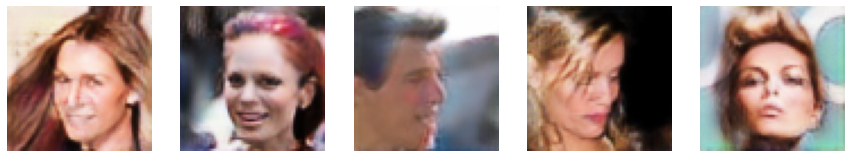

  Elapsed time: 120m 36s

======= Epoch 9 / 15 =======
Training...

  Batch 634  of  6331;	Elapsed time: 121m 43s
  Batch 1267  of  6331;	Elapsed time: 122m 48s
  Batch 1900  of  6331;	Elapsed time: 123m 54s
  Batch 2533  of  6331;	Elapsed time: 125m 0s
  Batch 3166  of  6331;	Elapsed time: 126m 6s
  Batch 3799  of  6331;	Elapsed time: 127m 12s
  Batch 4432  of  6331;	Elapsed time: 128m 18s
  Batch 5065  of  6331;	Elapsed time: 129m 24s
  Batch 5698  of  6331;	Elapsed time: 130m 30s
  Batch 6331  of  6331;	Elapsed time: 131m 36s

  Training statistics:   	G_loss: 4.403 	D_loss: -0.362

Validating & Saving...


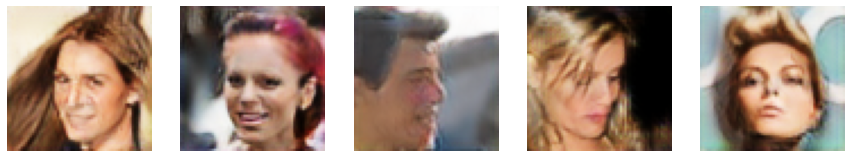

  Elapsed time: 131m 36s

======= Epoch 10 / 15 =======
Training...

  Batch 634  of  6331;	Elapsed time: 132m 42s
  Batch 1267  of  6331;	Elapsed time: 133m 48s
  Batch 1900  of  6331;	Elapsed time: 134m 54s
  Batch 2533  of  6331;	Elapsed time: 136m 0s
  Batch 3166  of  6331;	Elapsed time: 137m 6s
  Batch 3799  of  6331;	Elapsed time: 138m 12s
  Batch 4432  of  6331;	Elapsed time: 139m 18s
  Batch 5065  of  6331;	Elapsed time: 140m 24s
  Batch 5698  of  6331;	Elapsed time: 141m 30s
  Batch 6331  of  6331;	Elapsed time: 142m 36s

  Training statistics:   	G_loss: 4.399 	D_loss: -0.378

Validating & Saving...


  0%|          | 0/6331 [00:00<?, ?it/s]


  Validation statistics:	LPIPS: 0.078


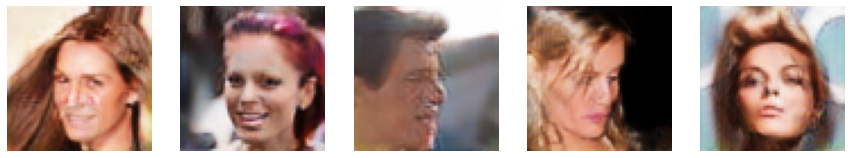

  Elapsed time: 151m 24s

======= Epoch 11 / 15 =======
Training...



KeyboardInterrupt: ignored

In [ ]:
# Here I've tried to continue learing, but the results only worsened
torch.manual_seed(115)
gen = Generator().to(device)
disc = Discriminator().to(device)
gen.load_state_dict(torch.load('/content/models/model/checkpoint8_gen', map_location=device))
disc.load_state_dict(torch.load('/content/models/model/checkpoint8_disc', map_location=device))

gen_opt = torch.optim.Adam(gen.parameters(), 0.0001, [0.5, 0.999]) # YOUR CODE  
disc_opt = torch.optim.Adam(disc.parameters(), 0.0001, [0.5, 0.999]) # YOUR CODE
gen_schd = torch.optim.lr_scheduler.MultiStepLR(gen_opt, milestones=[10,15], gamma=0.1)
disc_schd = torch.optim.lr_scheduler.MultiStepLR(disc_opt, milestones=[10,15], gamma=0.1)
step_num = 0

train_model_gan(gen, disc, gen_opt, disc_opt, gen_schd, disc_schd, num_epochs=15)

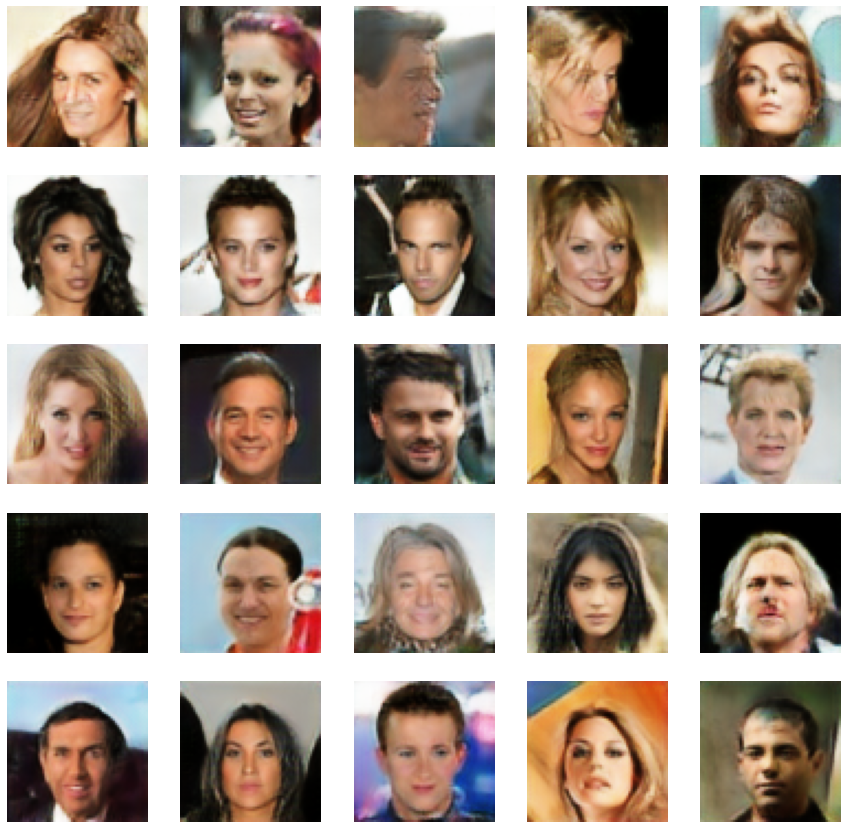

In [ ]:
def show_imgs(sz):
    plt.figure(figsize=(15, 3 * sz))

    image, label = next(iter(dataloader))

    image, label = image.to(device), label.to(device).float()
    target_domain = label.flip(dims=[0])

    fake_image = gen(image, target_domain)

    for index in range(fake_image.shape[0]):
        if index >= 5 * sz:
            break
        image = fake_image[index].detach().cpu()
        plt.subplot(sz, 5, index + 1)
        plot_img(image, t_invnormalize)
    plt.show()

show_imgs(5)

  0%|          | 0/1 [00:00<?, ?it/s]

Target domain: Black_Hair


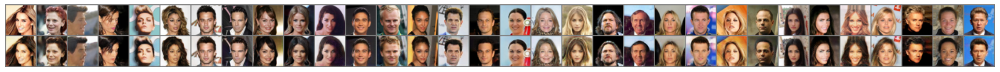

Target domain: Blond_Hair


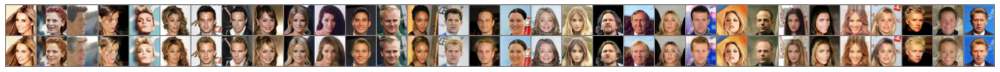

Target domain: Brown_Hair


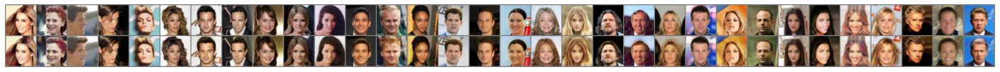

Target domain: Eyeglasses


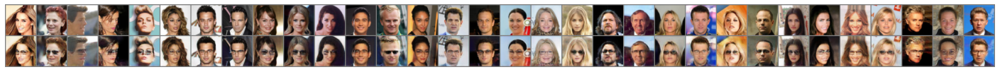

Target domain: Goatee


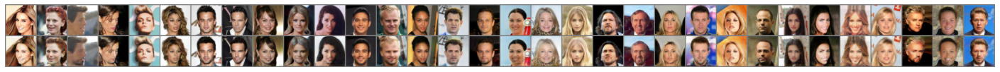

Target domain: Male


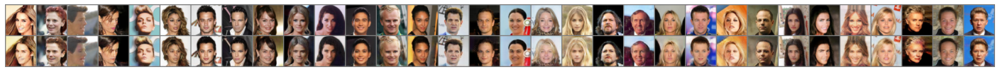

Target domain: Mustache


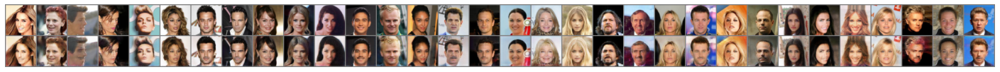

Target domain: Receding_Hairline


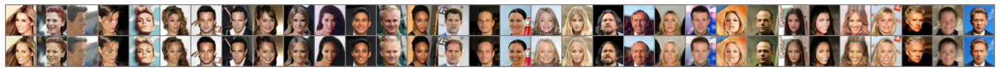

Target domain: Wearing_Hat


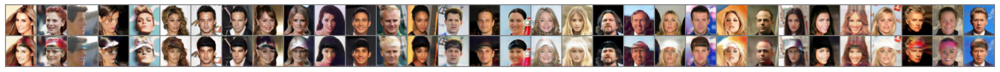

Target domain: Young


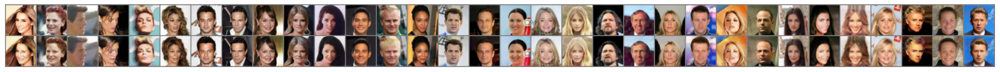

In [ ]:
from torchvision.utils import make_grid

test_iters = 1
gen.eval()

iter_loader = iter(dataloader)

for i in trange(test_iters):
    x_real, y_real = next(iter_loader)
    y_real = y_real.float()

    x_real, y_real = x_real.to(device), y_real.to(device)

    for label_index in range(10):

        y_trg = y_real.clone()
        y_trg[:, label_index] = 1 - y_trg[:, label_index] # reverse

        print(f'Target domain: {attr_name[label_index]}')

        with torch.no_grad():
            x_fake = gen(x_real, y_trg)

        plt.figure(figsize=(25, 15))
        x_show = make_grid(torch.cat([x_real, x_fake], dim=0), nrow=x_fake.shape[0], normalize=False).detach().cpu()
        plot_img(x_show, t_invnormalize)
        plt.show()    


Some domain transitions work successfully: eyes, hair, glasses. It's much worse with hats.

### Out of domain experiment

Let's try to apply the model to some out-of-domain picture.

Target domain: Black_Hair


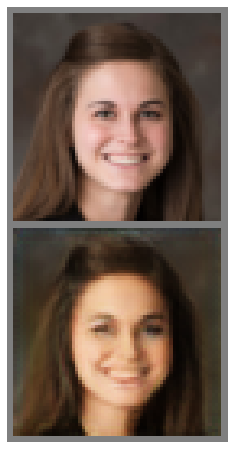

Target domain: Blond_Hair


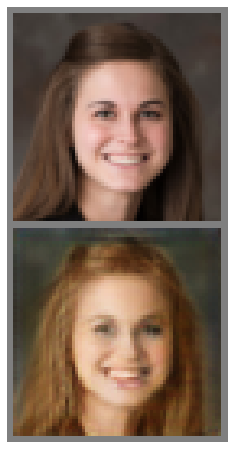

Target domain: Brown_Hair


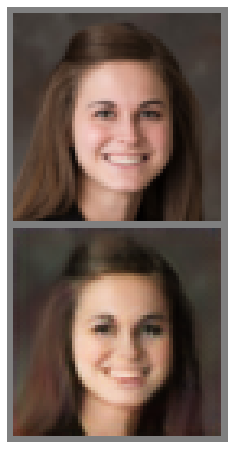

Target domain: Eyeglasses


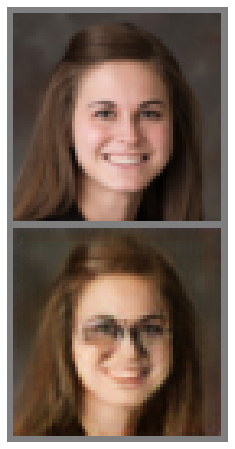

Target domain: Goatee


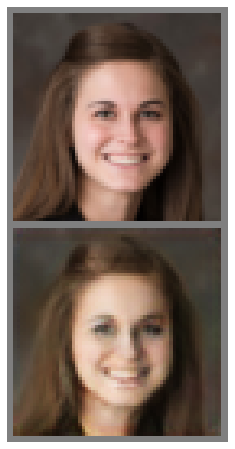

Target domain: Male


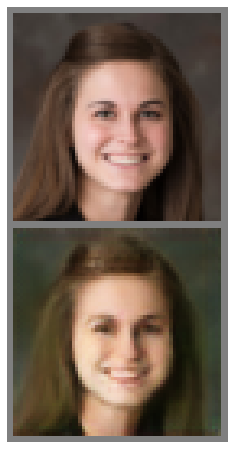

Target domain: Mustache


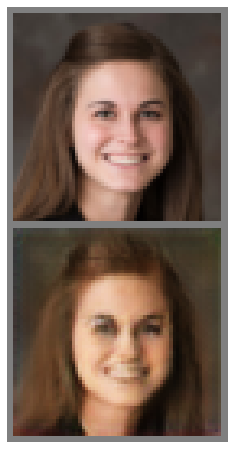

Target domain: Receding_Hairline


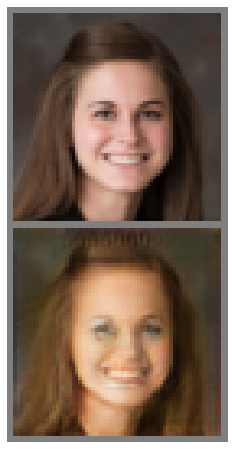

Target domain: Wearing_Hat


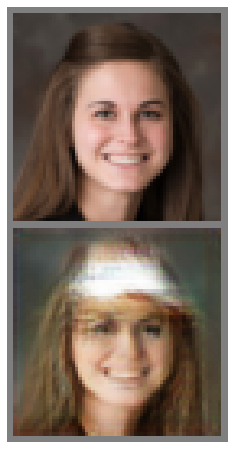

Target domain: Young


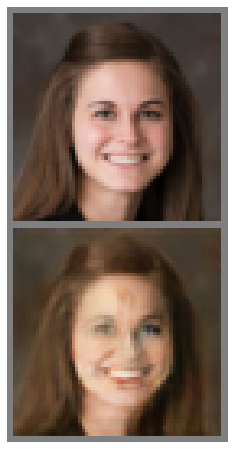

In [ ]:
from torchvision.utils import make_grid
from PIL import Image

test_iters = 1
gen.eval()

for i in range(1):
    x_real = transform(Image.open("/content/photo_2019-04-05_01-37-50.png")).unsqueeze(0)
    y_real = torch.tensor([[0, 0, 1, 0, 0, 0, 0, 0, 0, 1]]).float()

    x_real, y_real = x_real.to(device), y_real.to(device)

    for label_index in range(10):

        y_trg = y_real.clone()
        y_trg[:, label_index] = 1 - y_trg[:, label_index] # reverse

        print(f'Target domain: {attr_name[label_index]}')

        with torch.no_grad():
            x_fake = gen(x_real, y_trg)

        plt.figure(figsize=(8, 8))
        x_show = make_grid(torch.cat([x_real, x_fake], dim=0), nrow=x_fake.shape[0], normalize=False).detach().cpu()
        plot_img(x_show, t_invnormalize)
        plt.show()    

В целом терпимо - но это on the good side. Я пробовал другую картинку, где лицо было меньше - и модель не справлялась, просто делала лицо желтее.